
# Merge Sort — Step‑by‑Step + Animation (Beginner Friendly)

Welcome! This notebook is designed for **first‑time learners**.  
You will:
1. **See** what Merge Sort does (Quick Start animation).
2. **Understand** the idea with plain English & pseudocode.
3. **Trace** the algorithm step‑by‑step with **printouts**.
4. **Animate** it smoothly, with ready‑to‑run code.
5. Try small **practice** tweaks at the end.

## 🔴 0) Quick Start — Run these two cells to see Merge Sort in action
If you're in a hurry, **just run these two cells**. Then come back to learn *why* it works.


In [10]:

# Quick Start: imports
import random
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

print("Matplotlib version:", plt.matplotlib.__version__)


Matplotlib version: 3.10.0


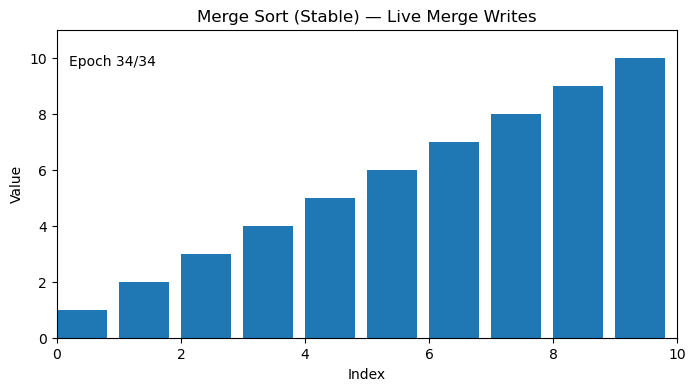

In [12]:
# Quick Start: stable, animation-friendly Merge Sort (yields snapshots)
def merge_sort(array, left, right):
    if right <= left:
        return
    mid = (left + right) // 2
    yield from merge_sort(array, left, mid)
    yield from merge_sort(array, mid + 1, right)
    yield from merge(array, left, mid, right)

def merge(array, left, mid, right):
    merged = []
    i, j = left, mid + 1
    while i <= mid and j <= right:
        if array[i] <= array[j]:          # <= keeps it STABLE
            merged.append(array[i]); i += 1
        else:
            merged.append(array[j]); j += 1
    while i <= mid:
        merged.append(array[i]); i += 1
    while j <= right:
        merged.append(array[j]); j += 1
    for offset, value in enumerate(merged):
        array[left + offset] = value
        yield array[:]                     # snapshot after each write


# Animate it (warning-free streaming)
N = 10
random.seed(1)
data = list(range(1, N + 1))
random.shuffle(data)

fig, ax = plt.subplots(figsize=(8, 4))
bars = ax.bar(range(len(data)), data, align='edge')
ax.set_xlim(0, len(data))
ax.set_ylim(0, max(data) * 1.1)
ax.set_title("Merge Sort (Stable) — Live Merge Writes")
ax.set_xlabel("Index")
ax.set_ylabel("Value")

frames = list(merge_sort(data[:], 0, len(data) - 1))
total_frames = len(frames)
epoch_text = ax.text(0.02, 0.92, "", transform=ax.transAxes, ha="left", va="top")
frames_with_idx = [(i, f) for i, f in enumerate(frames, start=1)]

def update(tup):
    i, frame = tup
    for rect, h in zip(bars, frame):
        rect.set_height(h)
    epoch_text.set_text(f"Epoch {i}/{total_frames}")
    return bars.patches + [epoch_text]  # include text for blitting

anim = FuncAnimation(
    fig, update,
    frames=frames_with_idx,
    interval=30, blit=True, repeat=False,
    cache_frame_data=False
)
HTML(anim.to_jshtml())


## 1) The idea of Merge Sort (plain English)

- **Split** the list into halves until pieces are size 0 or 1 (already sorted).  
- **Merge** the small sorted pieces back together by repeatedly taking the smaller front element.

Why it's good:
- Predictable time: ~`O(n log n)` in all cases.
- **Stable** (with `<=`): equal items keep their original order.
- Works great when extra memory for the temporary merge buffer is okay.



### Pseudocode

```text
# Assumptions
# - A is a 0-based indexable array/list.
# - L and R are INCLUSIVE bounds: 0 ≤ L ≤ R < len(A).
# - Goal: sort A[L..R] in ascending order.

procedure merge_sort(A, L, R):
  if R ≤ L:
    return                      # 0 or 1 element → already sorted

  M ← floor((L + R) / 2)

  # 1) Sort each half
  merge_sort(A, L, M)           # sorts A[L..M]
  merge_sort(A, M+1, R)         # sorts A[M+1..R]

  # 2) (Optional optimization) If halves are already in order, skip merge
  if A[M] ≤ A[M+1]:
    return

  # 3) Merge the two sorted halves back into A[L..R]
  merge(A, L, M, R)


procedure merge(A, L, M, R):
  # Precondition: A[L..M] and A[M+1..R] are each already sorted.
  B ← new array of size (R − L + 1)   # temporary buffer
  i ← L          # pointer into left half
  j ← M + 1      # pointer into right half
  k ← 0          # next write position in B

  # Merge until one half runs out
  while i ≤ M and j ≤ R do:
    # Using ≤ keeps the algorithm STABLE (take from left on ties)
    if A[i] ≤ A[j]:
      B[k] ← A[i]
      i ← i + 1
    else:
      B[k] ← A[j]
      j ← j + 1
    k ← k + 1

  # Copy any leftover elements (only one of these loops will run)
  while i ≤ M do:
    B[k] ← A[i]
    i ← i + 1
    k ← k + 1

  while j ≤ R do:
    B[k] ← A[j]
    j ← j + 1
    k ← k + 1

  # Copy the merged, sorted run back into A[L..R]
  for t from 0 to (R − L) do:
    A[L + t] ← B[t]
```


In [3]:
from IPython.display import Video

# Local file in same folder as the notebook
Video("merge_sort_demo.mp4", embed=True)               # embed=True keeps it inside the .ipynb


## 2) Guided Trace — see every step with printouts

Run the next two cells and watch the console.  
This version is **unconditionally verbose** to maximize clarity.


In [4]:
def merge_sort_trace(array, left, right):
    # Base case
    if right <= left:
        return

    mid = (left + right) // 2

    # Sort both halves (trace version)
    yield from merge_sort_trace(array, left, mid)
    yield from merge_sort_trace(array, mid + 1, right)

    # Merge with detailed prints
    yield from merge_trace(array, left, mid, right)

In [5]:
def merge_trace(array, left, mid, right):
    print(f"\n[merge] range=({left}:{right}) mid={mid}")
    print(f"  left run : {array[left:mid+1]}")
    print(f"  right run: {array[mid+1:right+1]}")

    merged = []
    i, j = left, mid + 1

    while i <= mid and j <= right:
        print(f"  compare L[{i}]={array[i]} vs R[{j}]={array[j]}", end=" -> ")
        if array[i] <= array[j]:                     # <= keeps it STABLE
            print(f"take L[{i}]")
            merged.append(array[i]); i += 1
        else:
            print(f"take R[{j}]")
            merged.append(array[j]); j += 1

    while i <= mid:
        print(f"  leftover L[{i}]={array[i]} -> append")
        merged.append(array[i]); i += 1
    while j <= right:
        print(f"  leftover R[{j}]={array[j]} -> append")
        merged.append(array[j]); j += 1

    print(f"  merged run: {merged}")

    for offset, value in enumerate(merged):
        idx = left + offset
        print(f"  write back array[{idx}] <- {value}")
        array[idx] = value
        yield array[:]   # snapshot after each write


In [6]:
# Try the trace on a tiny list so the output is readable
data = [5, 2, 4, 2]
print("Original:", data)
for _ in merge_sort_trace(data, 0, len(data) - 1):
    pass
print("Sorted:  ", data)


Original: [5, 2, 4, 2]

[merge] range=(0:1) mid=0
  left run : [5]
  right run: [2]
  compare L[0]=5 vs R[1]=2 -> take R[1]
  leftover L[0]=5 -> append
  merged run: [2, 5]
  write back array[0] <- 2
  write back array[1] <- 5

[merge] range=(2:3) mid=2
  left run : [4]
  right run: [2]
  compare L[2]=4 vs R[3]=2 -> take R[3]
  leftover L[2]=4 -> append
  merged run: [2, 4]
  write back array[2] <- 2
  write back array[3] <- 4

[merge] range=(0:3) mid=1
  left run : [2, 5]
  right run: [2, 4]
  compare L[0]=2 vs R[2]=2 -> take L[0]
  compare L[1]=5 vs R[2]=2 -> take R[2]
  compare L[1]=5 vs R[3]=4 -> take R[3]
  leftover L[1]=5 -> append
  merged run: [2, 2, 4, 5]
  write back array[0] <- 2
  write back array[1] <- 2
  write back array[2] <- 4
  write back array[3] <- 5
Sorted:   [2, 2, 4, 5]


## 3) Friendly Animation — tweak size & speed

- `N` : number of bars (try 10, 20, 40).  
- `interval`: delay (ms) between frames (larger = slower).  
- We silence the Matplotlib generator caching warning by setting `cache_frame_data=False`.


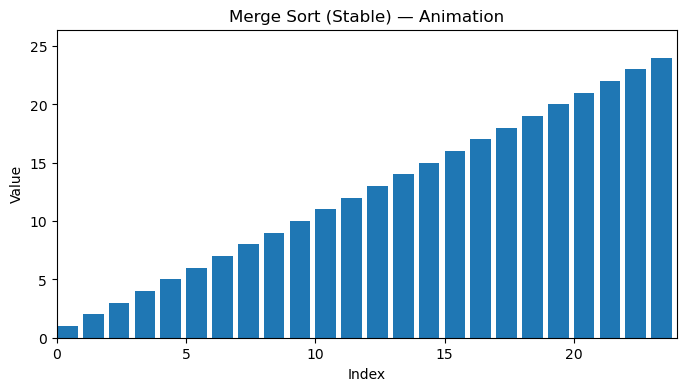

In [7]:
# Parameters you can tweak
N = 24
interval = 40
seed = 42

random.seed(seed)
data = list(range(1, N + 1))
random.shuffle(data)

fig, ax = plt.subplots(figsize=(8, 4))
bars = ax.bar(range(len(data)), data, align='edge')
ax.set_xlim(0, len(data))
ax.set_ylim(0, max(data) * 1.1)
ax.set_title("Merge Sort (Stable) — Animation")
ax.set_xlabel("Index")
ax.set_ylabel("Value")

frames = merge_sort(data, 0, len(data) - 1)

def update(frame):
    for rect, h in zip(bars, frame):
        rect.set_height(h)
    return bars

anim = FuncAnimation(
    fig, update, frames=frames,
    interval=interval, blit=True, repeat=False,
    cache_frame_data=False          # <- suppress generator cache warning
)
HTML(anim.to_jshtml())



### Optional: Precompute frames (uses more memory but has a known length)

If your machine is fast enough or `N` is small, you can precompute frames for easier scrubbing/saving:


Epoch 0:  [3, 4, 2, 1, 5]
Epoch 1:  [3, 4, 2, 1, 5]
Epoch 2:  [2, 4, 2, 1, 5]
Epoch 3:  [2, 3, 2, 1, 5]
Epoch 4:  [2, 3, 4, 1, 5]
Epoch 5:  [2, 3, 4, 1, 5]
Epoch 6:  [2, 3, 4, 1, 5]
Epoch 7:  [1, 3, 4, 1, 5]
Epoch 8:  [1, 2, 4, 1, 5]
Epoch 9:  [1, 2, 3, 1, 5]
Epoch 10:  [1, 2, 3, 4, 5]
Epoch 11:  [1, 2, 3, 4, 5]


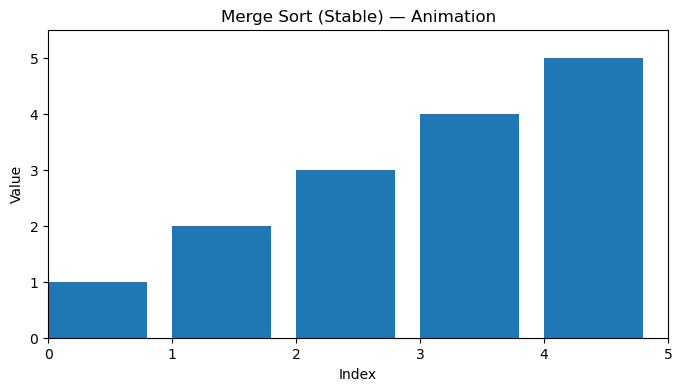

In [9]:
data = [3, 4, 2, 1, 5]

# Precompute frames from a COPY so initial bars stay unsorted
temp = data[:]
frames_list = list(merge_sort(temp, 0, len(temp) - 1))  # materialize

for i, elem in enumerate(frames_list):
    print(f"Epoch {i}:  {elem}")

fig, ax = plt.subplots(figsize=(8, 4))
bars = ax.bar(range(len(data)), data, align='edge')
ax.set_xlim(0, len(data))
ax.set_ylim(0, max(data) * 1.1)
ax.set_title("Merge Sort (Stable) — Animation")
ax.set_xlabel("Index")
ax.set_ylabel("Value")

def update(frame):
    for rect, h in zip(bars, frame):
        rect.set_height(h)
    return bars

anim = FuncAnimation(fig, update, frames=frames_list, interval=200, blit=True, repeat=False)
HTML(anim.to_jshtml())


## 🔴 4) Practice — Your turn

- Change `N`, `interval`, or `seed` and re-run the animation cell.
- Edit the trace version to print fewer details (e.g., only writes).
